В данной работе анализируется выборка данных с airbnb по Берлину в ноябре 2018. 
Датасет взят с https://www.kaggle.com/brittabettendorf/berlin-airbnb-data

In [84]:
#Построим вспомогательный класс.
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.style as style
import matplotlib.pyplot as plt
import scipy.stats
import statsmodels.api as sm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation, rc
from IPython.display import HTML
from collections import Counter
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
np.set_printoptions(suppress=True)


class Model:
    def __init__(self,dataframe,y_name,X_names):
        self.y_name = y_name
        self.X_names = X_names
        self.no_ones_X = np.array(dataframe[X_names])
        self.k = self.no_ones_X.shape[1] + 1
        self.n = self.no_ones_X.shape[0]
        self.y = np.array(dataframe[y_name]).reshape(self.n,-1)
        self.X = np.hstack((np.ones(self.n).reshape(self.n,-1),self.no_ones_X))
        self.b =  np.dot(np.linalg.inv(np.dot(self.X.T, self.X)),np.dot(self.X.T,self.y))
        self.y_estimated = np.dot(self.X,self.b)
        self.residuals = self.y - self.y_estimated
        self.TSS = sum((self.y-np.mean(self.y)) **2 )
        self.RSS = sum((self.y-self.y_estimated) **2 )
        self.ESS = self.TSS - self.RSS
        self.R2 = self.ESS / self.TSS
        self.sigma = self.RSS / (self.n - self.k)
        self.R2_adjusted = 1 - self.sigma/(self.TSS/(self.n-1))
        self.AIC = self.n * np.log(self.RSS / self.n) + 2 * self.k
        self.BIC = self.n * np.log(self.RSS / self.n) + np.log(self.n) * self.k
        self.b_correlation = self.sigma * np.linalg.inv(np.dot(self.X.T, self.X))
        self.b_std = np.array([[va ** (1/2) for j,va in enumerate(val) if j==i] for i,val in enumerate(self.b_correlation)])
        self.X_mean = self.no_ones_X.mean(axis=0)
        self.X_var = self.no_ones_X.var(axis=0,ddof=1)
        self.X_std = self.no_ones_X.std(axis=0,ddof=1)
        self.X_centred = self.no_ones_X - self.X_mean
        self.X_centr_stand = self.X_centred / self.X_std
        self.X_correlation = np.dot(self.X_centr_stand.T,self.X_centr_stand) / (self.n-1)
    def draw_X_correlation(self):
        def highlight_corr(val):
            if ((val > -0.999 and val < -0.8) or (val < 0.999 and val > 0.8)):
                color = 'Purple'
            elif ((val >= -0.8 and val < -0.6) or (val <= 0.8 and val > 0.6)):
                color = 'SteelBlue'
            elif ((val >= -0.6 and val < -0.4) or (val < 0.6 and val > 0.4)):
                color = 'SkyBlue'
            elif ((val >= -0.4 and val < -0.2) or (val < 0.4 and val > 0.2)):
                color = 'Turquoise '
            else:
                color = ''
            return f'background-color:{color}'
        output_df = pd.DataFrame(self.X_correlation,index=self.X_names,columns=self.X_names)
        display(output_df.style.set_caption('Корреляционная матрица независимых переменных').applymap(highlight_corr))
    def draw_b_correlation(self):
        intercept_names = ['Intercept'] + self.X_names
        output_df = pd.DataFrame(self.b_correlation,index=intercept_names,columns=intercept_names)
        display(output_df.style.set_caption('Корреляционная матрица оценок МНК'))
    def stats(self, norm=False):
        intercept_names = ['Intercept'] + self.X_names
        stat_observable = self.b / self.b_std
        if norm:
            p_value = np.round(2*(1 - scipy.stats.norm.cdf(abs(stat_observable))),5)
        else:
            p_value = np.round(2*(1 - scipy.stats.t.cdf(abs(stat_observable),self.n - self.k)),5)
        output_array = np.vstack((self.b.T, self.b_std.T,p_value.T,stat_observable.T))
        output_df = pd.DataFrame(data=output_array,index=['Оценки МНК','Стандартное отклонение оценок','p-значения','наблюдаемое значение'], columns=intercept_names).astype(object)
        display(output_df)
        quantiles_1 = scipy.stats.norm.ppf(0.995) if norm else scipy.stats.t.ppf(0.995,self.n - self.k)
        quantiles_5 = scipy.stats.norm.ppf(0.975) if norm else scipy.stats.t.ppf(0.975,self.n - self.k)
        print(f'Квантиль  5% уровня значимости: {quantiles_5:.2f} Квантиль 1% уровня значимости: {quantiles_1:.2f}')
    def quality(self):
        f_observed = (self.ESS/(self.k-1)) / (self.RSS/(self.n - self.k))
        f_crit = scipy.stats.f.ppf(0.95, self.k-1, self.n - self.k)
        f_pvalue = 1 - scipy.stats.f.cdf(f_observed, self.k-1, self.n - self.k)
        print(f'Значения F-статистики наблюдаемое: {f_observed[0]:.2f}, критическое: {f_crit:.2f}, p-значение: {f_pvalue[0]:.4f}')
        print(f'Показатели качества модели R^2: {self.R2[0]:.4f} R^2 adjusted: {self.R2_adjusted[0]:.4f}, AIC: {self.AIC[0]:.2f}, BIC: {self.BIC[0]:.2f}') 
    def summary(self,norm=False):
        self.stats(norm)
        self.quality()
    def sm_summary(self):
        est = sm.OLS(self.y, self.X)
        est2 = est.fit()
        display(est2.summary())

Загрузим тестовый датасет. Данные придется предварительно обработать.

In [85]:
pd.set_option('display.max_columns', None)


In [86]:
df_full = pd.read_csv('Berlin\listings_summary.csv')

display(df_full.head(3))
  
        

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,2015,https://www.airbnb.com/rooms/2015,20181107122246,2018-11-07,Berlin-Mitte Value! Quiet courtyard/very central,Great location! 30 of 75 sq meters. This wood...,A+++ location! This „Einliegerwohnung“ is an e...,Great location! 30 of 75 sq meters. This wood...,none,It is located in the former East Berlin area o...,"This is my home, not a hotel. I rent out occas...","Close to U-Bahn U8 and U2 (metro), Trams M12, ...","Simple kitchen/cooking, refrigerator, microwav...",Always available,"No parties No events No pets No smoking, not e...",NaN,NaN,https://a0.muscache.com/im/pictures/260fd609-7...,NaN,2217,https://www.airbnb.com/users/show/2217,Ian,2008-08-18,"Key Biscayne, Florida, United States",Believe in sharing economy.,within an hour,96%,NaN,t,https://a0.muscache.com/im/pictures/21428a22-4...,https://a0.muscache.com/im/pictures/21428a22-4...,Mitte,4.0,4.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"Berlin, Berlin, Germany",Mitte,Brunnenstr. Süd,Mitte,Berlin,Berlin,10119,Berlin,"Berlin, Germany",DE,Germany,52.534537,13.402557,f,Guesthouse,Entire home/apt,3,1.0,1.0,2.0,Real Bed,"{TV,""Cable TV"",Wifi,Kitchen,Gym,Heating,""Famil...",NaN,$60.00,NaN,NaN,$200.00,$30.00,1,$28.00,4,1125,3 months ago,t,0,21,51,141,2018-11-07,118,2016-04-11,2018-10-28,93.0,10.0,9.0,10.0,10.0,10.0,9.0,t,NaN,NaN,f,f,strict_14_with_grace_period,f,f,4,3.76
1,2695,https://www.airbnb.com/rooms/2695,20181107122246,2018-11-07,Prenzlauer Berg close to Mauerpark,NaN,In the summertime we are spending most of our ...,In the summertime we are spending most of our ...,none,NaN,NaN,Within walking distance you'll find the S-Bahn...,Außer deinem Zimmer kannst du noch die Küche u...,NaN,NaN,NaN,NaN,https://a0.muscache.com/im/pictures/97d4f6e8-1...,NaN,2986,https://www.airbnb.com/users/show/2986,Michael,2008-09-16,"Berlin, Berlin, Germany",Living with my wife in Berlin. Like travellin...,NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/50434955-1...,https://a0.muscache.com/im/pictures/50434955-1...,Prenzlauer Berg,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,"Berlin, Berlin, Germany",NaN,Prenzlauer Berg Nordwest,Pankow,Berlin,Berlin,10437,Berlin,"Berlin, Germany",DE,Germany,52.548513,13.404553,t,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,"{Wifi,Kitchen,Elevator,Heating,Washer,Essentia...",NaN,$17.00,NaN,NaN,$0.00,$0.00,1,$0.00,2,40,7 weeks ago,t,0,0,0,0,2018-11-07,6,2018-07-04,2018-10-01,100.0,10.0,10.0,10.0,10.0,10.0,10.0,t,NaN,NaN,f,f,flexible,f,f,1,1.42
2,3176,https://www.airbnb.com/rooms/3176,20181107122246,2018-1

In [87]:
columns_to_keep = ['id','host_id', 'host_since', 'host_response_time', 'host_response_rate', 'host_is_superhost', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'beds', 'bedrooms', 'amenities', 'price', 'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people', 'minimum_nights', 'has_availability', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'instant_bookable', 'cancellation_policy', 'reviews_per_month', 'latitude', 'longitude', 'availability_30' ]
df =df_full[columns_to_keep]
df.head(5)
print(df.amenities.unique())
df.property_type.value_counts(normalize=True)

['{TV,"Cable TV",Wifi,Kitchen,Gym,Heating,"Family/kid friendly","Smoke detector",Essentials,Shampoo,"Lock on bedroom door",Hangers,"Hair dryer",Iron,"Laptop friendly workspace","Private living room",Bathtub,"Hot water","Bed linens","Extra pillows and blankets",Microwave,"Coffee maker",Refrigerator,Dishwasher,"Dishes and silverware","Cooking basics",Stove,"Luggage dropoff allowed","Long term stays allowed"}'
 '{Wifi,Kitchen,Elevator,Heating,Washer,Essentials,Shampoo,"Hair dryer","Laptop friendly workspace","Private living room"}'
 '{Internet,Wifi,Kitchen,"Buzzer/wireless intercom",Heating,"Family/kid friendly",Washer,"Smoke detector","Carbon monoxide detector","First aid kit","Safety card","Fire extinguisher",Essentials,Shampoo,"24-hour check-in",Hangers,"Hair dryer",Iron,"Laptop friendly workspace"}'
 ...
 '{Wifi,Kitchen,Heating,Washer,"Fire extinguisher",Essentials,Iron,"Hot water"}'
 '{Wifi,"Paid parking off premises",Doorman,Elevator,Heating,"Family/kid friendly","Smoke detector","S

Apartment                 0.896816
Condominium               0.027137
Loft                      0.020397
House                     0.017648
Serviced apartment        0.007760
Hostel                    0.005676
Townhouse                 0.004390
Guest suite               0.003281
Bed and breakfast         0.002838
Guesthouse                0.002527
Hotel                     0.002217
Other                     0.002084
Boutique hotel            0.001907
Bungalow                  0.000887
Boat                      0.000754
Tiny house                0.000532
Camper/RV                 0.000488
Houseboat                 0.000488
Villa                     0.000443
Aparthotel                0.000310
Pension (South Korea)     0.000310
Cabin                     0.000266
Cottage                   0.000177
Resort                    0.000133
Casa particular (Cuba)    0.000089
Castle                    0.000089
Train                     0.000089
Chalet                    0.000044
Tipi                

In [88]:
# фильтр только по апартаментам, для однородности данных.
df = df.loc[(df['property_type'] == 'Apartment'), :  ]
df.drop(["property_type"], axis=1, inplace=True)
df.head(2)

,id,host_id,host_since,host_response_time,host_response_rate,host_is_superhost,room_type,accommodates,bathrooms,beds,bedrooms,amenities,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,has_availability,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,reviews_per_month,latitude,longitude,availability_30
1,2695,2986,2008-09-16,NaN,NaN,f,Private room,2,1.0,1.0,1.0,"{Wifi,Kitchen,Elevator,Heating,Washer,Essentia...",$17.00,$0.00,$0.00,1,$0.00,2,t,6,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f,flexible,1.42,52.548513,13.404553,0
2,3176,3718,2008-10-19,within a day,100%,f,Entire home/apt,4,1.0,2.0,1.0,"{Internet,Wifi,Kitchen,""Buzzer/wireless interc...",$90.00,$200.00,$50.00,2,$20.00,62,t,143,92.0,9.0,9.0,9.0,9.0,10.0,9.0,t,strict_14_with_grace_period,1.25,52.534996,13.417579,0


In [89]:
# Удобства
results = Counter()
df['amenities'].str.strip('{}')\
               .str.replace('"', '')\
               .str.lstrip('\"')\
               .str.rstrip('\"')\
               .str.split(',')\
               .apply(results.update)

results.most_common(30)

[('Kitchen', 19350),
 ('Wifi', 19323),
 ('Heating', 18991),
 ('Essentials', 18208),
 ('Washer', 16805),
 ('Hair dryer', 13197),
 ('Laptop friendly workspace', 12917),
 ('Hangers', 12164),
 ('Iron', 9867),
 ('Shampoo', 9394),
 ('TV', 8696),
 ('Hot water', 8418),
 ('Family/kid friendly', 7101),
 ('Internet', 7028),
 ('Host greets you', 5860),
 ('Buzzer/wireless intercom', 5602),
 ('Smoke detector', 5329),
 ('Lock on bedroom door', 4563),
 ('Refrigerator', 4545),
 ('Free street parking', 4477),
 ('Dishes and silverware', 4426),
 ('Smoking allowed', 4294),
 ('Cooking basics', 4230),
 ('Elevator', 4222),
 ('Stove', 4208),
 ('Bed linens', 4177),
 ('Oven', 3857),
 ('translation missing: en.hosting_amenity_50', 3755),
 ('First aid kit', 3348),
 ('Cable TV', 3181)]

In [90]:
#выделим несколько не обязательно самых популярных характеристик

# Wifi in amenities - 1 if there is, 0 if not
def lock(value):
    if "Lock on bedroom door" in value.lower():
        return 1
    else:
        return 0
    
df["lock"] = df["amenities"].apply(lock)

# Tv in amenities - 1 if there is, 0 if not
def tv(value):
    if "tv" in value.lower():
        return 1
    else:
        return 0
df["tv"] = df["amenities"].apply(tv)

# Kitchen in amenities - 1 if there is, 0 if not
def kitchen(value):
    if "kitchen" in value.lower():
        return 1
    else:
        return 0
    
df["kitchen"] = df["amenities"].apply(kitchen)
df.drop(['amenities'], axis=1, inplace=True)
# security_deposit, cleaning_fee - NaNs replaced with 0
df["security_deposit"].fillna("$0.00", inplace=True)
df["cleaning_fee"].fillna("$0.00", inplace=True)
df.head(5)

,id,host_id,host_since,host_response_time,host_response_rate,host_is_superhost,room_type,accommodates,bathrooms,beds,bedrooms,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,has_availability,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,reviews_per_month,latitude,longitude,availability_30,lock,tv,kitchen
1,2695,2986,2008-09-16,NaN,NaN,f,Private room,2,1.0,1.0,1.0,$17.00,$0.00,$0.00,1,$0.00,2,t,6,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f,flexible,1.42,52.548513,13.404553,0,0,0,1
2,3176,3718,2008-10-19,within a day,100%,f,Entire home/apt,4,1.0,2.0,1.0,$90.00,$200.00,$50.00,2,$20.00,62,t,143,92.0,9.0,9.0,9.0,9.0,10.0,9.0,t,strict_14_with_grace_period,1.25,52.534996,13.417579,0,0,0,1
3,3309,4108,2008-11-07,NaN,NaN,f,Private room,2,1.0,1.0,1.0,$26.00,$250.00,$30.00,1,$18.00,5,t,25,88.0,9.0,9.0,9.0,10.0,9.0,9.0,f,strict_14_with_grace_period,0.39,52.498855,13.349065,0,0,0,0
4,7071,17391,2009-05-16,within an hour,100%,t,Private room,2,1.0,2.0,1.0,$42.00,$0.00,$0.00,1,$24.00,2,t,197,96.0,10.0,10.0,10.0,10.0,10.0,9.0,f,moderate,1.75,52.543157,13.415091,15,0,0,0
5,9991,33852,2009-08-25,within a few hours,100%,f,Entire home/apt,7,2.5,7.0,4.0,$180.00,$400.00,$80.00,5,$10.00,6,t,6,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f,strict_14_with_grace_period,0.15,52.533031,13.416047,0,0,1,1


In [91]:
# удаление доллара из цен и проебразование в число
df.price = df.price.str.replace('$', '').str.replace(',', '').astype(float)
df.cleaning_fee = df.cleaning_fee.str.replace('$', '').str.replace(',', '').astype(float)
df.security_deposit = df.security_deposit.str.replace('$', '').str.replace(',', '').astype(float)
df.extra_people = df.extra_people.str.replace('$', '').str.replace(',', '').astype(float)
df.head()

,id,host_id,host_since,host_response_time,host_response_rate,host_is_superhost,room_type,accommodates,bathrooms,beds,bedrooms,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,has_availability,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,reviews_per_month,latitude,longitude,availability_30,lock,tv,kitchen
1,2695,2986,2008-09-16,NaN,NaN,f,Private room,2,1.0,1.0,1.0,17.0,0.0,0.0,1,0.0,2,t,6,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f,flexible,1.42,52.548513,13.404553,0,0,0,1
2,3176,3718,2008-10-19,within a day,100%,f,Entire home/apt,4,1.0,2.0,1.0,90.0,200.0,50.0,2,20.0,62,t,143,92.0,9.0,9.0,9.0,9.0,10.0,9.0,t,strict_14_with_grace_period,1.25,52.534996,13.417579,0,0,0,1
3,3309,4108,2008-11-07,NaN,NaN,f,Private room,2,1.0,1.0,1.0,26.0,250.0,30.0,1,18.0,5,t,25,88.0,9.0,9.0,9.0,10.0,9.0,9.0,f,strict_14_with_grace_period,0.39,52.498855,13.349065,0,0,0,0
4,7071,17391,2009-05-16,within an hour,100%,t,Private room,2,1.0,2.0,1.0,42.0,0.0,0.0,1,24.0,2,t,197,96.0,10.0,10.0,10.0,10.0,10.0,9.0,f,moderate,1.75,52.543157,13.415091,15,0,0,0
5,9991,33852,2009-08-25,within a few hours,100%,f,Entire home/apt,7,2.5,7.0,4.0,180.0,400.0,80.0,5,10.0,6,t,6,100.0,10.0,10.0,10.0,10.0,10.0,10.0,f,strict_14_with_grace_period,0.15,52.533031,13.416047,0,0,1,1


In [92]:
df.info()
print(df.host_response_rate.unique())
print(df.host_response_time.unique())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 20225 entries, 1 to 22551
Data columns (total 35 columns):
id                             20225 non-null int64
host_id                        20225 non-null int64
host_since                     20201 non-null object
host_response_time             8466 non-null object
host_response_rate             8466 non-null object
host_is_superhost              20201 non-null object
room_type                      20225 non-null object
accommodates                   20225 non-null int64
bathrooms                      20195 non-null float64
beds                           20201 non-null float64
bedrooms                       20214 non-null float64
price                          20225 non-null float64
security_deposit               20225 non-null float64
cleaning_fee                   20225 non-null float64
guests_included                20225 non-null int64
extra_people                   20225 non-null float64
minimum_nights                 20225 non-n

In [93]:
df.host_response_time = df.host_response_time.fillna('a few days or more')
df.host_response_rate = df.host_response_rate.fillna('0%')
# Пожертвую небольшой частью данных для упрощения обработки, там где null в host_response. 
# 
df = df.dropna(axis='rows')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16225 entries, 1 to 22424
Data columns (total 35 columns):
id                             16225 non-null int64
host_id                        16225 non-null int64
host_since                     16225 non-null object
host_response_time             16225 non-null object
host_response_rate             16225 non-null object
host_is_superhost              16225 non-null object
room_type                      16225 non-null object
accommodates                   16225 non-null int64
bathrooms                      16225 non-null float64
beds                           16225 non-null float64
bedrooms                       16225 non-null float64
price                          16225 non-null float64
security_deposit               16225 non-null float64
cleaning_fee                   16225 non-null float64
guests_included                16225 non-null int64
extra_people                   16225 non-null float64
minimum_nights                 16225 non

In [94]:
df["bedrooms"].mean()  # среднее значение спален почти 1, так что при  пропущенном значении поставлю 1
df["bedrooms"].fillna(1.0, inplace=True)
# "instant_bookable" - replace True as 1, False as 0
def bookable(value):
    if value == "t":
        return 1
    else:
        return 0
    
df["instant_bookable"] = df["instant_bookable"].apply(bookable)

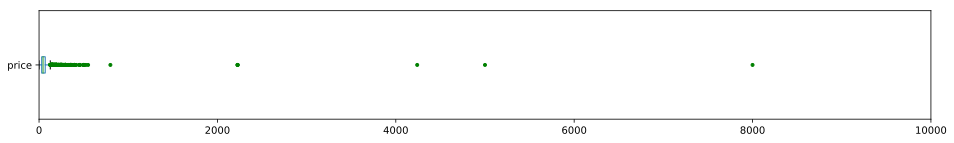

In [95]:
red_square = dict(markerfacecolor='g', markeredgecolor='g', marker='.')
df['price'].plot(kind='box', xlim=(0, 10000), vert=False, flierprops=red_square, figsize=(16,2));

In [96]:
#удаление подозрительных цен
df.drop(df[ (df.price > 600) | (df.price == 0) ].index, axis=0, inplace=True)

In [98]:
# Расчет до центра Берлина
from geopy.distance import great_circle

def distance_from_centre(lat, lon):
    berlin_centre = (52.520008, 13.404954)
    apartment_spot = (lat, lon)
    return round(great_circle(berlin_centre, apartment_spot).km, 1)

df["Distance"] = df.apply(lambda x: distance_from_centre(x.latitude, x.longitude), axis=1)
df.drop(["latitude", "longitude"], axis=1, inplace=True)


In [99]:
df.room_type.value_counts(normalize=True)

Private room       0.523560
Entire home/apt    0.468484
Shared room        0.007956
Name: room_type, dtype: float64

In [100]:
df.host_response_time.value_counts(normalize=True)

a few days or more    0.549093
within an hour        0.246269
within a few hours    0.105464
within a day          0.099174
Name: host_response_time, dtype: float64

In [101]:
df.cancellation_policy.value_counts(normalize=True)

moderate                       0.352782
flexible                       0.351055
strict_14_with_grace_period    0.293327
super_strict_30                0.002714
super_strict_60                0.000123
Name: cancellation_policy, dtype: float64

In [102]:
df.loc[(df['host_is_superhost']=='f'), ['host_is_superhost']] = 0
df.loc[(df['host_is_superhost']=='t'), ['host_is_superhost']] = 1
df.loc[(df['room_type']=='Shared room'), ['room_type']] = 1
df.loc[(df['room_type']=='Entire home/apt'), ['room_type']] = 3
df.loc[(df['room_type']=='Private room'), ['room_type']] = 2
df.loc[(df['host_response_time']=='within an hour'), ['host_response_time']] = 1
df.loc[(df['host_response_time']=='within a few hours'), ['host_response_time']] = 2
df.loc[(df['host_response_time']=='within a day'), ['host_response_time']] = 3
df.loc[(df['host_response_time']=='a few days or more'), ['host_response_time']] = 4
df.loc[(df['cancellation_policy']=='flexible'), ['cancellation_policy']] = 1
df.loc[(df['cancellation_policy']=='moderate'), ['cancellation_policy']] = 2
df.loc[(df['cancellation_policy']=='strict_14_with_grace_period'), ['cancellation_policy']] = 3
df.loc[(df['cancellation_policy']=='super_strict_30'), ['cancellation_policy']] = 4
df.loc[(df['cancellation_policy']=='super_strict_60'), ['cancellation_policy']] = 4

In [103]:
# нас интересуют те, кто сдает посуточно, а не долгосрочно
print(df['minimum_nights'].describe())
df = df.loc[(df['minimum_nights']<7)]

count    16214.000000
mean         6.542062
std         44.700532
min          1.000000
25%          2.000000
50%          2.000000
75%          4.000000
max       5000.000000
Name: minimum_nights, dtype: float64


In [104]:
df.drop(['has_availability'], axis=1, inplace=True)


In [105]:
df_final = df.copy()  # shallow copy of the Dataframe
#print(df.isna().sum())
df_final.head()


,id,host_id,host_since,host_response_time,host_response_rate,host_is_superhost,room_type,accommodates,bathrooms,beds,bedrooms,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,reviews_per_month,availability_30,lock,tv,kitchen,Distance
1,2695,2986,2008-09-16,4,0%,0,2,2,1.0,1.0,1.0,17.0,0.0,0.0,1,0.0,2,6,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,1.42,0,0,0,1,3.2
3,3309,4108,2008-11-07,4,0%,0,2,2,1.0,1.0,1.0,26.0,250.0,30.0,1,18.0,5,25,88.0,9.0,9.0,9.0,10.0,9.0,9.0,0,3,0.39,0,0,0,0,4.5
4,7071,17391,2009-05-16,1,100%,1,2,2,1.0,2.0,1.0,42.0,0.0,0.0,1,24.0,2,197,96.0,10.0,10.0,10.0,10.0,10.0,9.0,0,2,1.75,15,0,0,0,2.7
5,9991,33852,2009-08-25,2,100%,0,3,7,2.5,7.0,4.0,180.0,400.0,80.0,5,10.0,6,6,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,3,0.15,0,0,1,1,1.6
13,22415,86068,2010-02-27,2,75%,1,3,4,1.0,2.0,2.0,98.0,300.0,50.0,2,25.0,3,61,94.0,10.0,9.0,10.0,10.0,10.0,9.0,0,3,0.59,0,0,1,1,3.2


Анализ данных

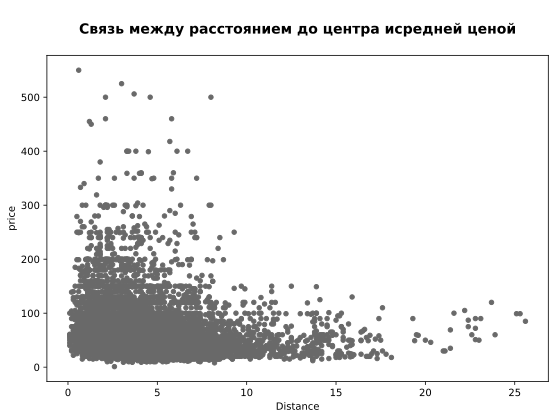

In [106]:
df_final.plot.scatter(x="Distance", y="price", figsize=(9,6), c='dimgrey')
plt.title('\nСвязь между расстоянием до центра исредней ценой\n', fontsize=14, fontweight='bold');

Таким образом, руководствуясь описанными выши принципами начнём построение модели с наибольшим количеством признаков, поэтапно тестируя и убирая незначимые переменные из модели. Построим модель и посмотрим на корреляцию между независимыми переменными.

In [107]:
#Цену включу сразу в помимо зависмых, в независимые переменные, чтобы посмотреть ее корреляцию с характеристиками жилья
display(df_final.head())
dependent = 'price'
independent = ['price','host_response_time','host_is_superhost','room_type','bathrooms','bedrooms','security_deposit',
               'cleaning_fee','guests_included','extra_people','minimum_nights','review_scores_rating','review_scores_accuracy',
               'review_scores_cleanliness','review_scores_checkin', 'tv',  'Distance']
model_1 = Model(df_final,dependent,independent)
model_1.draw_X_correlation()
print('R2',model_1.R2)

,id,host_id,host_since,host_response_time,host_response_rate,host_is_superhost,room_type,accommodates,bathrooms,beds,bedrooms,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,reviews_per_month,availability_30,lock,tv,kitchen,Distance
1,2695,2986,2008-09-16,4,0%,0,2,2,1.0,1.0,1.0,17.0,0.0,0.0,1,0.0,2,6,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,1.42,0,0,0,1,3.2
3,3309,4108,2008-11-07,4,0%,0,2,2,1.0,1.0,1.0,26.0,250.0,30.0,1,18.0,5,25,88.0,9.0,9.0,9.0,10.0,9.0,9.0,0,3,0.39,0,0,0,0,4.5
4,7071,17391,2009-05-16,1,100%,1,2,2,1.0,2.0,1.0,42.0,0.0,0.0,1,24.0,2,197,96.0,10.0,10.0,10.0,10.0,10.0,9.0,0,2,1.75,15,0,0,0,2.7
5,9991,33852,2009-08-25,2,100%,0,3,7,2.5,7.0,4.0,180.0,400.0,80.0,5,10.0,6,6,100.0,10.0,10.0,10.0,10.0,10.0,10.0,0,3,0.15,0,0,1,1,1.6
13,22415,86068,2010-02-27,2,75%,1,3,4,1.0,2.0,2.0,98.0,300.0,50.0,2,25.0,3,61,94.0,10.0,9.0,10.0,10.0,10.0,9.0,0,3,0.59,0,0,1,1,3.2


,price,host_response_time,host_is_superhost,room_type,bathrooms,bedrooms,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,tv,Distance
price,1,-0.102243,0.0736042,0.480453,0.258278,0.526053,0.201542,0.541855,0.487959,0.223543,0.0488707,0.00981758,-0.0115567,0.0768314,0.00127463,0.272599,-0.155785
host_response_time,-0.102243,1,-0.244731,0.0459053,-0.024552,-0.0276929,-0.0430908,-0.130143,-0.0703607,-0.132842,0.0698426,-0.0266287,-0.0289388,-0.0876447,-0.0392924,-0.0773317,0.00756929
host_is_superhost,0.0736042,-0.244731,1,-0.0406761,0.0174624,0.00969044,0.0302305,0.105214,0.0626181,0.109398,-0.0513897,0.156363,0.152424,0.18734,0.1298,0.060263,-0.00575465
room_type,0.480453,0.0459053,-0.0406761,1,0.0064004,0.25857,0.150007,0.407298,0.293944,0.0941737,0.174232,-0.0383684,-0.0294107,0.0270234,-0.0288667,0.272473,-0.0427334
bathrooms,0.258278,-0.024552,0.0174624,0.0064004,1,0.290708,0.0583267,0.165628,0.210775,0.0662011,0.0219015,-0.00128123,-0.0114494,-0.00848968,-0.0120026,0.0759613,-0.0108407
bedrooms,0.526053,-0.0276929,0.00969044,0.25857,0.290708,1,0.120727,0.360956,0.426875,0.151521,0.0715286,-0.00845822,-0.030341,0.022547,-0.00406839,0.158453,0.00108476
security_deposit,0.201542,-0.0430908,0.0302305,0.150007,0.0583267,0.120727,1,0.295531,0.126295,0.153116,0.0654626,0.00960854,-0.00687788,0.0326416,-0.00602834,0.0750638,-0.0198182
cleaning_fee,0.541855,-0.130143,0.105214,0.407298,0.165628,0.360956,0.295531,1,0.381361,0.319231,0.0803616,0.00743755,0.00615743,0.107805,0.00984167,0.252523,-0.0752305
guests_included,0.487959,-0.0703607,0.0626181,0.293944,0.210775,0.426875,0.126295,0.381361,1,0.336156,0.0258626,-0.0324273,-0.021417,0.0157336,-0.00497996,0.177749,-0.0184786
extra_people,0.223543,-0.132842,0.109398,0.0941737,0.0662011,0.151521,0.153116,0.319231,0.336156,1,-0.0600416,-0.0052798,-0.00182365,0.0631831,0.0172577,0.1102,-0.0294472


R2 [1.]


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


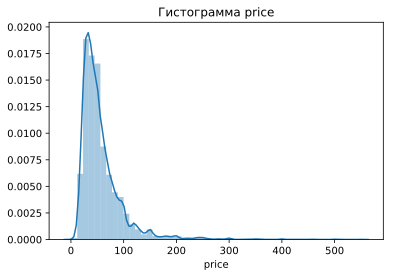

In [108]:
plt.title(f'Гистограмма {dependent}')
sns.distplot(df[dependent])
plt.show()
#посмотрим на распределение переменных построив гистограммы 

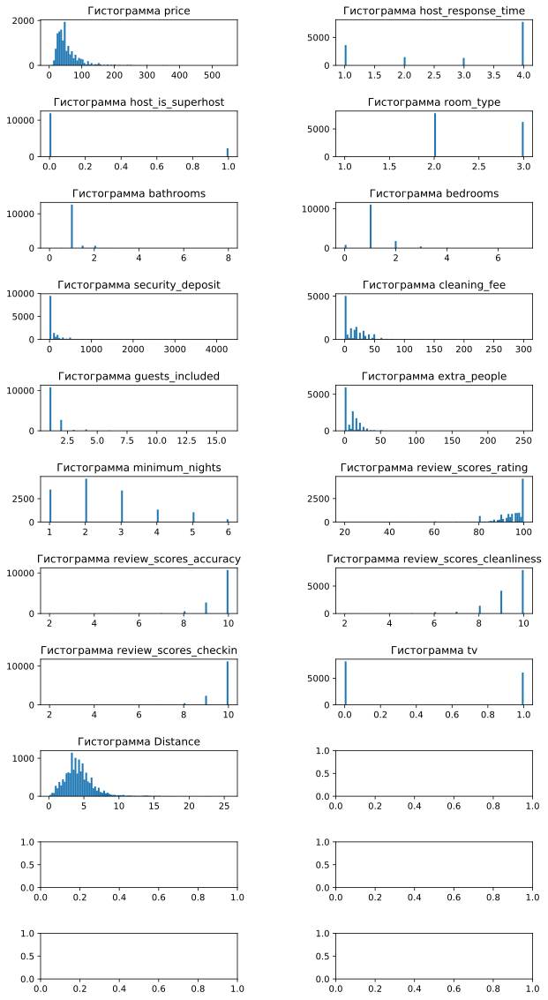

In [109]:
fig, ax = plt.subplots(nrows=11, ncols=2)
axf = ax.flatten()
for i,variable in enumerate(independent):
    axf[i].hist(df[variable],bins=100)
    axf[i].set_title(f'Гистограмма {variable}')
fig.set_size_inches(10,20)
plt.subplots_adjust(wspace=0.5,hspace=1)

Видим, что есть переменные с значительной взаимной корреляцией, но как максимум, они имеют общие причины и заменить одну на другую нельзя

In [110]:
# Посмотрим полезные средние значения цены аренды  при аренде на 6 дней , с учетом уборки:
cost1 =(df_final.loc[df_final['room_type'] == 1, 'price']*6+df_final.loc[df_final['room_type'] == 1, 'cleaning_fee'])
cost2 =(df_final.loc[df_final['room_type'] == 2, 'price']*6+df_final.loc[df_final['room_type'] == 2, 'cleaning_fee'])
cost3 =(df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 1.0), 'price']*6+df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 1.0), 'cleaning_fee'])
cost4 =(df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 2.0), 'price']*6+df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 2.0), 'cleaning_fee'])
cost5 =(df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] >= 3.0), 'price']*6+df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] >= 3.0), 'cleaning_fee'])
print('Средняя цена за сутки для всех категорий ', df_final[['price']].mean())
print('Средняя цена аренды места в комнате', cost1.mean())
print('Средняя цена аренды комнаты', cost2.mean())
print('Средняя цена аренды квартиры c одной спальней', cost3.mean())
print('Средняя цена аренды квартиры c двумя спальнями', cost4.mean())
print('Средняя цена аренды квартиры c не менее чем тремя спальнями', cost5.mean())
 


Средняя цена за сутки для всех категорий  price    56.500035
dtype: float64
Средняя цена аренды места в комнате 206.91869918699186
Средняя цена аренды комнаты 243.82775364170712
Средняя цена аренды квартиры c одной спальней 416.08034473172086
Средняя цена аренды квартиры c двумя спальнями 594.5444162436548
Средняя цена аренды квартиры c не менее чем тремя спальнями 973.1286307053942


Предварительный вывод: слишком близкие значения для места в комнате и комнаты - может означать нехватку размещений с общей комнататой или переизбыток предолжения по комнатам, или очень хорошее расположение у этих общих комнат. 
Цена сдачи двух комнат отдельно ниже, чем цена квартиры с двумя спальнями, что говорит либо о переизбытке предложений по комнатам, либо нехватке предложений с квартирами.
Проверим также частоту отзывов в месяц по этим условиям, чтобы проверить эти предположения.
(Пока  не учитываем количество людей в комнате).

In [111]:
freq1 = (df_final.loc[df_final['room_type'] == 1, 'reviews_per_month'])
freq2 = (df_final.loc[df_final['room_type'] == 2, 'reviews_per_month'])
freq3 = (df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 1.0), 'reviews_per_month'])
freq4 = (df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 2.0), 'reviews_per_month'])
freq5 = (df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] >= 3.0), 'reviews_per_month'])


print('Средняя частота отзывов при аренде места в комнате', freq1.mean())
print('Средняя частота отзывов при аренде комнаты', freq2.mean())
print('Средняя частота отзывов при аренде однокомнатной квартиры', freq3.mean())
print('Средняя частота отзывов при аренде квартиры с двумя спальнями', freq4.mean())
print('Средняя частота отзывов при аренде квартиры с более чем 3 спальнями', freq5.mean())

Средняя частота отзывов при аренде места в комнате 1.5319512195121952
Средняя частота отзывов при аренде комнаты 1.213966266291844
Средняя частота отзывов при аренде однокомнатной квартиры 1.1645649152071142
Средняя частота отзывов при аренде квартиры с двумя спальнями 1.1567258883248706
Средняя частота отзывов при аренде квартиры с более чем 3 спальнями 1.4851037344398328


Видим, что место в комнате арендуют чаще, что может подтверждать предположение о нехватке дешевых мест или переизбытке предложений с комнатами(хотя возможно кроватьв комнате арендуют на меньшее количество дней). Близкое значение отзывов для комнат и квартир подтверждает нехватку предложений с квартирами, их сдавать значительно выгоднее. Цена многокомнатных квартир и частота отзывов заставляют предположить лучшую заполняемость и выгоду сдачи целиком многокомнатных квартир. Проверю эти гипотезы также на доступности квартир в календаре на 30 дней.

In [112]:
days1 = df_final.loc[df_final['room_type'] == 1, 'availability_30']
days2 = df_final.loc[df_final['room_type'] == 2, 'availability_30']
days3 = df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 1.0), 'availability_30']
days4 = df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 2.0), 'availability_30']
days5 = df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] >= 3.0), 'availability_30']

print('Дней доступно на 30 дней для аренды места в комнате', days1.mean())
print('Дней доступно на 30 дней для аренды комнаты', days2.mean())
print('Дней доступно на 30 дней для аренды однокомнатной квартиры', days3.mean())
print('Дней доступно на 30 дней для аренды квартиры с двумя спальнями', days4.mean())
print('Дней доступно на 30 дней для аренды многокомнатных квартир' , days5 .mean())

Дней доступно на 30 дней для аренды места в комнате 9.308943089430894
Дней доступно на 30 дней для аренды комнаты 5.260925121390238
Дней доступно на 30 дней для аренды однокомнатной квартиры 3.7133722546566585
Дней доступно на 30 дней для аренды квартиры с двумя спальнями 5.217639593908629
Дней доступно на 30 дней для аренды многокомнатных квартир 6.340248962655601


По этой характеристике гипотезы не подтверждаются, самыми свободными оказываются места со сдачей места в комнате.  Тем не менее, еще есть шанс, что их забронируют, возможно хостелы меньше отличаются друг от друга и люди не спешат их заранее бронировать. У остальных заполняемость довольно высокая (80-90%), так что это не вносит сильные изменения в предыдущие предположения, просто частично нивелирует их. При том что ноябрь должен быть низкий сезон. Предполагаю, что когда люди путешествуют более чем парой, они бронируют на более длительное время, чем одиночки и пары, поэтому остаются пустые день-два в промежутке между бронированиями. 
На основе столь косвенных данных попробую оценить доходность за 30 дней по категориям:

In [113]:
print('Доход за 30 дней при сдаче места в комнате', (freq1*(30 - days1)*cost1/6).mean())
print('Доход за 30 дней  при сдаче комнаты', (freq2*(30 - days2)*cost2/6).mean())
print('Доход за 30 дней  при сдаче однокомнатной квартиры', (freq3*(30 - days3)*cost3/6).mean())
print('Доход за 30 дней  при сдаче квартиры с двумя спальнями', (freq4*(30 - days4)*cost4/6).mean())
print('Доход за 30 дней  при сдаче многокомнатных квартир', (freq5*(30 - days5)*cost5/6).mean())

Доход за 30 дней при сдаче места в комнате 785.0681571815718
Доход за 30 дней  при сдаче комнаты 1034.0690126927354
Доход за 30 дней  при сдаче однокомнатной квартиры 1929.7718867574872
Доход за 30 дней  при сдаче квартиры с двумя спальнями 2505.461043781726
Доход за 30 дней  при сдаче многокомнатных квартир 5093.483222683264


Итого, все таки неожиданно близкие цены угла в комнате и самой комнаты. 
Самое доходная сдача помещения - места в комнате. И если имеется квартира, ее выгоднее сдавать целиком, а не по комнатам. С свою очередь гостям может быть выгоднее искать не квартиру целиком, а квартиру, в которой сдаются отдельно комнаты и занять все эти комнаты.

In [114]:
# Дисперсионный анализ
# Посчитаем  несмещенную дисперсию и отклонение для указанных категорий
df_final['price'].var(ddof=1)
print('Дисперсия цены за сутки при сдаче места в комнате',(df_final.loc[df_final['room_type'] == 1, 'price']).var(ddof=1))
print('Дисперсия цены за сутки при сдаче комнаты',(df_final.loc[df_final['room_type'] == 2, 'price']).var(ddof=1))
print('Дисперсия цены за сутки ри сдаче однокомнатной квартиры',(df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 1.0), 'price']).var(ddof=1))
print('Дисперсия цены за сутки при сдаче квартиры с двумя спальнями',(df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 2.0), 'price']).var(ddof=1))
print('Дисперсия цены за сутки при сдаче многокомнатных квартир',(df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 3.0), 'price']).var(ddof=1))

print('Ср. кв. отклонение цены за сутки при сдаче места в комнате',(df_final.loc[df_final['room_type'] == 1, 'price']).std(ddof=1))
print('Ср. кв. отклонение цены за сутки при сдаче комнаты',(df_final.loc[df_final['room_type'] == 2, 'price']).std(ddof=1))
print('Ср. кв. отклонение цены за суткипри  сдаче однокомнатной квартиры',(df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 1.0), 'price']).std(ddof=1))
print('Ср. кв. отклонение цены за сутки при сдаче квартиры с двумя спальнями',(df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 2.0), 'price']).std(ddof=1))
print('Ср. кв. отклонение цены за сутки сдаче многокомнатных квартир',(df_final.loc[(df_final['room_type'] == 3) & (df_final['bedrooms'] == 3.0), 'price']).std(ddof=1))



Дисперсия цены за сутки при сдаче места в комнате 630.0996934559507
Дисперсия цены за сутки при сдаче комнаты 453.62712550692066
Дисперсия цены за сутки ри сдаче однокомнатной квартиры 762.6646994173442
Дисперсия цены за сутки при сдаче квартиры с двумя спальнями 2203.7051869309275
Дисперсия цены за сутки при сдаче многокомнатных квартир 5937.423643794076
Ср. кв. отклонение цены за сутки при сдаче места в комнате 25.101786658641466
Ср. кв. отклонение цены за сутки при сдаче комнаты 21.29852402179364
Ср. кв. отклонение цены за суткипри  сдаче однокомнатной квартиры 27.616384618869724
Ср. кв. отклонение цены за сутки при сдаче квартиры с двумя спальнями 46.94363840746611
Ср. кв. отклонение цены за сутки сдаче многокомнатных квартир 77.0546795710298


In [115]:
#Видно, что отклонение слишком значительное и интервал 3сигма уйдет в минус из за несимметричности распределения. Поэтому квантили, которым соответсвует 80% выборки.
print('Диапазон цен для 80% выборки при сдаче места в комнате',(df_final.loc[df_final['room_type'] == 1, 'price']).quantile(0.1), (df_final.loc[df_final['room_type'] == 1, 'price']).quantile(0.9))
print('Диапазон цен для 80% выборки при сдаче комнаты',(df_final.loc[df_final['room_type'] == 2, 'price']).quantile(0.1), (df_final.loc[df_final['room_type'] == 2, 'price']).quantile(0.9))
print('Диапазон цен для 80% выборки при сдаче квартиры',(df_final.loc[df_final['room_type'] == 3, 'price']).quantile(0.1), (df_final.loc[df_final['room_type'] == 3, 'price']).quantile(0.9))




Диапазон цен для 80% выборки при сдаче места в комнате 15.0 56.8
Диапазон цен для 80% выборки при сдаче комнаты 22.0 60.0
Диапазон цен для 80% выборки при сдаче квартиры 40.0 129.0


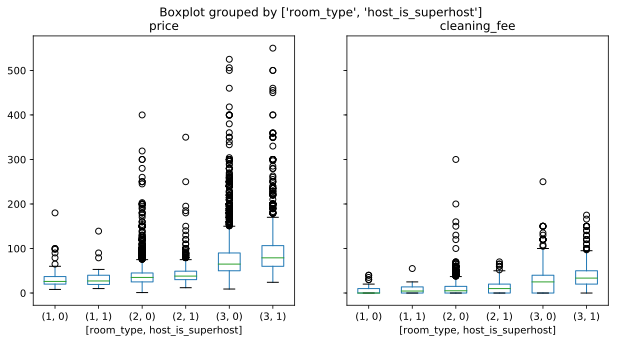

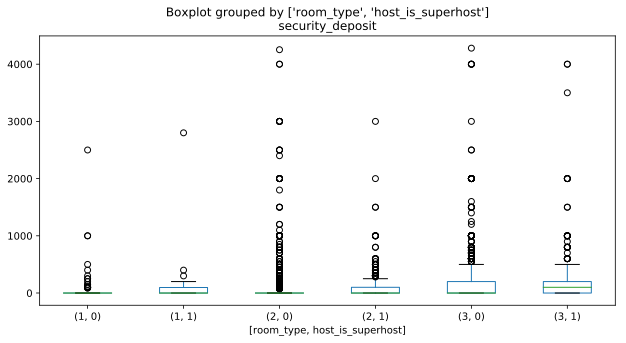

In [116]:
# Также построю боксплот для ценовых параметров
df_final.boxplot(figsize = (10,5) , by =['room_type', 'host_is_superhost'], column =['price', 'cleaning_fee'], grid = False) 
df_final.boxplot(figsize = (10,5) , by =['room_type', 'host_is_superhost'], column =['security_deposit'], grid = False) 

ПО боксплотам видно, что хотя ценник у суперхостов в среднем выше, у них более адекватные цены(меньше выбросов)

In [117]:
# Диаграмма расстояния до центра похожа на нормальное распределение.

In [118]:
# Проверим гипотезу, что суперхост сдает апартаменты на 20% дороже и потом расчитаем факт.

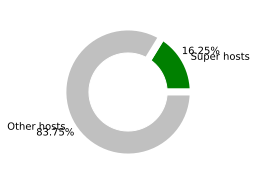

In [119]:
# Какими характеристиками обладает суперхост?
# assign the data
super_host    = df_final.host_is_superhost.value_counts()[1]
no_super_host = df_final.host_is_superhost.value_counts()[0]
names = ['Super hosts','Other hosts']
size  = [super_host, no_super_host]

# create a pie chart
plt.pie(size, labels=names, colors=['green','silver'], 
        autopct='%.2f%%', pctdistance=1.28,
        wedgeprops={'linewidth':7, 'edgecolor':'white'})

# create circle for the center of the plot to make the pie look like a donut
my_circle = plt.Circle((0,0), 0.6, color='white')

# plot the donut chart
fig = plt.gcf()
fig.set_size_inches(3,3)
fig.gca().add_artist(my_circle)
plt.show()

In [120]:
# разница в средней цене между суперхостами и прочими
df_final.groupby('host_is_superhost')['price'].agg(np.median)

host_is_superhost
0    45.0
1    49.0
Name: price, dtype: float64

In [121]:
# разница в частоте отзывов между суперхостами и прочими
df_final.groupby('host_is_superhost')['reviews_per_month'].agg(np.median)

host_is_superhost
0    0.45
1    1.93
Name: reviews_per_month, dtype: float64

In [122]:
# разница в частоте отзывов между суперхостами и прочими
# суперхосты отвечают в среднем в течение суток, остальные в среднем ждут более суток
df_final.groupby('host_is_superhost')['host_response_time'].mean()

host_is_superhost
0    3.070840
1    2.213945
Name: host_response_time, dtype: float64

In [123]:
# гости суперхостов немного больше удовлетоврены ценой
df_final.groupby('host_is_superhost')['review_scores_value'].mean()


host_is_superhost
0    9.372521
1    9.674318
Name: review_scores_value, dtype: float64

In [124]:
# гости суперхостов немного больше удовлетоврены чистотой
df_final.groupby('host_is_superhost')['review_scores_cleanliness'].mean()

host_is_superhost
0    9.224958
1    9.750974
Name: review_scores_cleanliness, dtype: float64

In [125]:
# гости суперхостов немного больше удовлетоврены заездом
df_final.groupby('host_is_superhost')['review_scores_checkin'].mean()

host_is_superhost
0    9.674790
1    9.919446
Name: review_scores_checkin, dtype: float64

In [126]:
# гости суперхостов немного больше удовлетоврены общением с арендатором
df_final.groupby('host_is_superhost')['review_scores_communication'].mean()

host_is_superhost
0    9.697311
1    9.946730
Name: review_scores_communication, dtype: float64

In [127]:
# гости суперхостов немного больше удовлетворены расположением
df_final.groupby('host_is_superhost')['review_scores_location'].mean()

host_is_superhost
0    9.481681
1    9.677350
Name: review_scores_location, dtype: float64

In [128]:
# гости суперхостов немного больше удовлетворены точностью описания
df_final.groupby('host_is_superhost')['review_scores_accuracy'].mean()

host_is_superhost
0    9.621597
1    9.920745
Name: review_scores_accuracy, dtype: float64

In [129]:
# Сравню средние цены по категориям на расстоянии до 2 км от центра и на среднем расстоянии
dist_mean = df_final['Distance'].mean()
print(dist_mean)
#Видно, что отклонение
print('Средняя цена при сдаче места в комнате в центре города',(df_final.loc[(df_final['room_type'] == 1)&(df_final['Distance'] <= 2), 'price']).mean())
print('Средняя цена при сдаче места в комнате при обычном расположении',(df_final.loc[(df_final['room_type'] == 1)&(df_final['Distance'] <= dist_mean+0.5)&(df_final['Distance'] >= dist_mean-0.5), 'price']).mean())
print('Средняя цена при сдаче комнаты в центре города',(df_final.loc[(df_final['room_type'] == 2)&(df_final['Distance'] <= 2), 'price']).mean())
print('Средняя цена при сдаче комнаты при обычном расположении',(df_final.loc[(df_final['room_type'] == 2)&(df_final['Distance'] <= dist_mean+0.5)&(df_final['Distance'] >= dist_mean-0.5), 'price']).mean())
print('Средняя цена при сдаче квартиры в центре города',(df_final.loc[(df_final['room_type'] == 3)&(df_final['Distance'] <= 2), 'price']).mean())
print('Средняя цена при сдаче квартиры при обычном расположении',(df_final.loc[(df_final['room_type'] == 3)&(df_final['Distance'] <= dist_mean+0.5)&(df_final['Distance'] >= dist_mean-0.5), 'price']).mean())


4.359173763107882
Средняя цена при сдаче места в комнате в центре города 43.333333333333336
Средняя цена при сдаче места в комнате при обычном расположении 33.107142857142854
Средняя цена при сдаче комнаты в центре города 50.70775623268698
Средняя цена при сдаче комнаты при обычном расположении 36.654038997214485
Средняя цена при сдаче квартиры в центре города 101.06380638063807
Средняя цена при сдаче квартиры при обычном расположении 70.90902021772939


Центральное расположение дает преимущество по цене примерно на 40%.

Построенная гистограмма на первый взгляд очень похожа на нормальное распределение с нулевым средним.

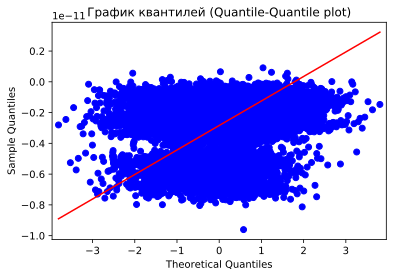

In [130]:
from statsmodels.graphics.gofplots import qqplot
qqplot(model_1.residuals, line='s')
plt.title('График квантилей (Quantile-Quantile plot)')
plt.show()

График квантилей (Quantile-Quantile plot) показывает на сколько распределение случайной величины похоже на нормальное. При нормальном распределении проверяемой переменной точки на графике квантилей должны выстраиваться в прямую линию, исходящую под улом 45 градусов из левого нижнего угла графика.Но график квантилей сигнализирует о явно не похожем на нормальное распределнии т.к. распределение квантилей даже близко не похоже на линию.

Автокорреляции не наблюдается, т.к. в противном случае мы бы наблюдали около-линейную связь.

Исследуем выборку на кластеры используя преобразование t-SNE предварительно стандартизировав данные

In [131]:
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation, rc
from IPython.display import HTML
from sklearn.preprocessing import StandardScaler

tsne = TSNE(n_components = 3, learning_rate=250,random_state=42)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[independent])
X_tSNE = tsne.fit_transform(X_scaled)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [132]:
fig = plt.figure(figsize=plt.figaspect(0.3))
ax = fig.add_subplot(131)
ax.scatter(X_tSNE[:,0],X_tSNE[:,1], c='g', marker='.')
ax2 = fig.add_subplot(132)
ax2.scatter(X_tSNE[:,0], X_tSNE[:,2], c='g', marker='.')
ax3 = fig.add_subplot(133)
ax3.scatter(X_tSNE[:,1], X_tSNE[:,2], c='g', marker='.')
fig.set_size_inches(12,4)
plt.subplots_adjust(wspace=0.01,hspace=0.3)
plt.show()